<a href="https://colab.research.google.com/github/annisasuciati/TA-DTI/blob/main/Copy_of_eda_w_shap_missing_migrants.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Missing Migrants Dataset

In [1802]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

%matplotlib inline

# Load and Clean Dataset

In [1803]:
data = pd.read_csv('https://raw.githubusercontent.com/annisasuciati/TA-DTI/main/MissingMigrants-Global-2020-12-03T13-19-00.csv', encoding='latin-1') # load data from csv
data.head() #first 5 rows

,Web ID,Region,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
0,54353,Caribbean,"November 26, 2020",2020,Nov,2.0,13.0,15,3.0,NaN,4.0,NaN,Presumed drowning,"Off the coast of Punta del Coco, Lagunas de Ni...","Bavaro Digital, Informado","19.095626250191, -69.591168297656",Dominican Republic to Puerto Rico,"https://archive.vn/wno1A, https://archive.vn/X...",Uncategorized,3
1,54344,North Africa,"November 24, 2020",2020,Nov,1.0,NaN,1,51.0,NaN,NaN,NaN,"Unknown (presumed dehydration, hypothermia)",On board of a boat rescued by Salvamento MarÃ­...,"rtve, AFP","27.355587205826, -16.497294462500",Western African,"https://archive.vn/MaGcf, https://archive.vn/r...",Uncategorized,3
2,54347,North Africa,"November 24, 2020",2020,Nov,8.0,NaN,8,28.0,NaN,8.0,NaN,Presumed drowning (beaten and thrown into river),"Bodies washed up to the coast of Lanzarote, Ca...","EuropaPress, rtve, El Pais, Diario de Avisos","29.229976356699, -13.421058505078",Western African,"https://archive.vn/RItNa, https://archive.vn/M...",Uncategorized,3
3,54326,Mediterranean,"November 23, 2020",2020,Nov,1.0,NaN,1,13.0,NaN,1.0,NaN,Presumed drowning,"Body found on beach in northwestern Rhodes, Gr...","Reuters, Associated Press","36.465524782991, 28.231215810156",Eastern Mediterranean,"https://archive.ph/537Jn, https://archive.ph/V...",Uncategorized,3
4,54327,US-Mexico Border,"November 21, 2020",2020,Nov,1.0,NaN,1,NaN,1.0,NaN,1.0,Presumed drowning,Remains found buried close to the Rio Bravo at...,ZÃ³calo,"28.350894379517, -100.321731086330",NaN,"https://archive.vn/wQPtX, https://archive.vn/h...",Central America,1


In [1804]:
data.sample(5)

,Web ID,Region,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
7348,41030,US-Mexico Border,"June 29, 2015",2015,Jun,1.0,NaN,1,NaN,NaN,1.0,NaN,Unknown (skeletal remains),"Imperial County, CA",Entravision,"33.024950500000, -115.845024500000",Central America to US,http://bit.ly/2ayUenC,Uncategorized,1
1413,51953,Mediterranean,"August 13, 2019",2019,Aug,1.0,13.0,14,1.0,NaN,1.0,NaN,Unknown,Unspecified location in the Maltese SAR zone i...,IOM Malta,"35.084140361617, 15.850744875000",Central Mediterranean,"http://bit.ly/2ZUXf6S, https://yhoo.it/2H4ceUQ",Uncategorized,4
933,53577,North Africa,"November 15, 2019",2019,Nov,1.0,NaN,1,NaN,1.0,NaN,1.0,"Sickness and lack of access to medicines, Star...","Tamanrasset, Algeria",Mixed Migration Monitoring Mechanism Initiativ...,"22.787960000000, 5.527180000000",NaN,NaN,Northern Africa,2
1891,52751,Mediterranean,"May 12, 2019",2019,May,1.0,NaN,1,NaN,NaN,NaN,NaN,Unknown,"Off the coast of Qarapoli, Libya",IOM Libya,"32.818811709166, 13.708121984993",Central Mediterranean,NaN,Uncategorized,4
6943,41017,US-Mexico Border,"November 08, 2015",2015,Nov,1.0,NaN,1,NaN,NaN,NaN,NaN,Unknown (skeletal remains),Pima County,Pima County Office of the Medical Examiner,"31.621437300000, -111.930093400000",Central America to US,NaN,Northern America,5


In [1805]:
data.columns

Index(['Web ID', 'Region', 'Reported Date', 'Reported Year', 'Reported Month',
       'Number Dead', 'Minimum Estimated Number of Missing',
       'Total Dead and Missing', 'Number of Survivors', 'Number of Females',
       'Number of Males', 'Number of Children', 'Cause of Death',
       'Location Description', 'Information Source', 'Location Coordinates',
       'Migration Route', 'URL', 'UNSD Geographical Grouping',
       'Source Quality'],
      dtype='object')

In [1806]:
#Renaming data columns for better understanding of the fields
# data.rename(columns={'id': 'ID',
#                       'cause_of_death': 'CauseOfDeath',
#                       'region_origin': 'RegionOfOrigin',
#                       'affected_nationality': 'Nationality',
#                       'missing': 'MissingNumberOfPeople',
#                       'dead': 'DeadNumberOfPeople',
#                       'incident_region': 'IncidentRegion',
#                       'date': 'Date',
#                       'source': 'Source',
#                       'reliability': 'Reliability',
#                       'lat': 'Latitud',
#                       'lon': 'Longitud'}, inplace=True)

In [1807]:
data.head()

,Web ID,Region,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
0,54353,Caribbean,"November 26, 2020",2020,Nov,2.0,13.0,15,3.0,NaN,4.0,NaN,Presumed drowning,"Off the coast of Punta del Coco, Lagunas de Ni...","Bavaro Digital, Informado","19.095626250191, -69.591168297656",Dominican Republic to Puerto Rico,"https://archive.vn/wno1A, https://archive.vn/X...",Uncategorized,3
1,54344,North Africa,"November 24, 2020",2020,Nov,1.0,NaN,1,51.0,NaN,NaN,NaN,"Unknown (presumed dehydration, hypothermia)",On board of a boat rescued by Salvamento MarÃ­...,"rtve, AFP","27.355587205826, -16.497294462500",Western African,"https://archive.vn/MaGcf, https://archive.vn/r...",Uncategorized,3
2,54347,North Africa,"November 24, 2020",2020,Nov,8.0,NaN,8,28.0,NaN,8.0,NaN,Presumed drowning (beaten and thrown into river),"Bodies washed up to the coast of Lanzarote, Ca...","EuropaPress, rtve, El Pais, Diario de Avisos","29.229976356699, -13.421058505078",Western African,"https://archive.vn/RItNa, https://archive.vn/M...",Uncategorized,3
3,54326,Mediterranean,"November 23, 2020",2020,Nov,1.0,NaN,1,13.0,NaN,1.0,NaN,Presumed drowning,"Body found on beach in northwestern Rhodes, Gr...","Reuters, Associated Press","36.465524782991, 28.231215810156",Eastern Mediterranean,"https://archive.ph/537Jn, https://archive.ph/V...",Uncategorized,3
4,54327,US-Mexico Border,"November 21, 2020",2020,Nov,1.0,NaN,1,NaN,1.0,NaN,1.0,Presumed drowning,Remains found buried close to the Rio Bravo at...,ZÃ³calo,"28.350894379517, -100.321731086330",NaN,"https://archive.vn/wQPtX, https://archive.vn/h...",Central America,1


In [1808]:
#Descriptive or summary statistics of numeric columns
data.describe()

,Web ID,Reported Year,Number Dead,Minimum Estimated Number of Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Source Quality
count,7818.000000,7818.000000,7533.000000,695.000000,1114.000000,1655.000000,4487.000000,1090.000000,7818.000000
mean,46353.083653,2017.464953,2.927386,25.002878,52.185817,1.780665,1.777803,2.084404,2.880276
std,6263.926010,1.610971,11.573195,59.189434,125.429091,2.557605,4.692589,8.035289,1.385147
min,30158.000000,2014.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,42779.250000,2016.000000,1.000000,2.000000,4.000000,1.000000,1.000000,1.000000,2.000000
50%,44877.500000,2018.000000,1.000000,6.000000,13.000000,1.000000,1.000000,1.000000,2.000000
75%,52286.750000,2019.000000,2.000000,21.500000,49.000000,2.000000,1.000000,2.000000,4.000000
max,54355.000000,2020.000000,750.000000,750.000000,1950.000000,30.000000,135.000000,250.000000,5.000000


In [1809]:
#Concise summary of the dataframe
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7818 entries, 0 to 7817
Data columns (total 20 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Web ID                               7818 non-null   int64  
 1   Region                               7818 non-null   object 
 2   Reported Date                        7818 non-null   object 
 3   Reported Year                        7818 non-null   int64  
 4   Reported Month                       7818 non-null   object 
 5   Number Dead                          7533 non-null   float64
 6   Minimum Estimated Number of Missing  695 non-null    float64
 7   Total Dead and Missing               7818 non-null   object 
 8   Number of Survivors                  1114 non-null   float64
 9   Number of Females                    1655 non-null   float64
 10  Number of Males                      4487 non-null   float64
 11  Number of Children            

In [1810]:
#Returns the dimensions of the array
#Rows & Columns
data.shape

(7818, 20)

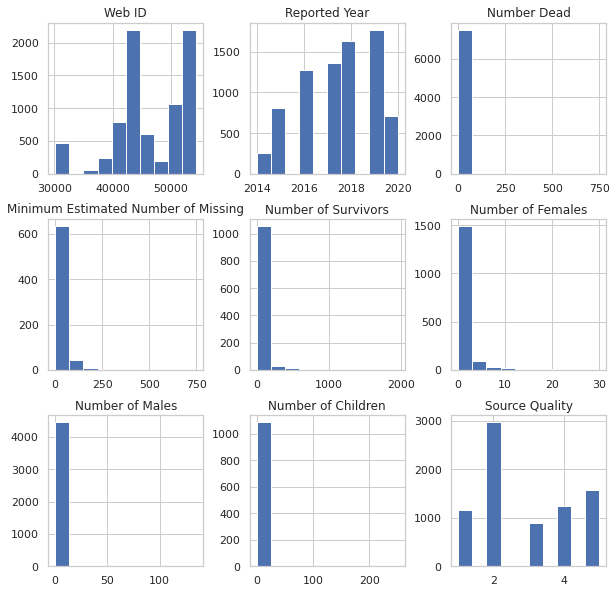

In [1811]:
#Representation of the distribution of data
data.hist(figsize=[10,10]);

In [1812]:
#Drop rows that have min of 9 NAN values
data.dropna(thresh=9,inplace=True)

In [1813]:
#Returns the dimensions of the array
#Rows & Columns
data.shape

(7818, 20)

In [1814]:
#Percentage of NAN Values
data.isna().mean().round(4) * 100

Web ID                                  0.00
Region                                  0.00
Reported Date                           0.00
Reported Year                           0.00
Reported Month                          0.00
Number Dead                             3.65
Minimum Estimated Number of Missing    91.11
Total Dead and Missing                  0.00
Number of Survivors                    85.75
Number of Females                      78.83
Number of Males                        42.61
Number of Children                     86.06
Cause of Death                          0.79
Location Description                    0.13
Information Source                      0.03
Location Coordinates                    0.00
Migration Route                        54.28
URL                                    39.36
UNSD Geographical Grouping              2.83
Source Quality                          0.00
dtype: float64

In [1815]:
#Number of NAN Values
data.isna().sum()

Web ID                                    0
Region                                    0
Reported Date                             0
Reported Year                             0
Reported Month                            0
Number Dead                             285
Minimum Estimated Number of Missing    7123
Total Dead and Missing                    0
Number of Survivors                    6704
Number of Females                      6163
Number of Males                        3331
Number of Children                     6728
Cause of Death                           62
Location Description                     10
Information Source                        2
Location Coordinates                      0
Migration Route                        4244
URL                                    3077
UNSD Geographical Grouping              221
Source Quality                            0
dtype: int64

In [1816]:
data['Location Coordinates'].isna().sum()

0

## Cleaning per column 

In [1817]:
data.columns

Index(['Web ID', 'Region', 'Reported Date', 'Reported Year', 'Reported Month',
       'Number Dead', 'Minimum Estimated Number of Missing',
       'Total Dead and Missing', 'Number of Survivors', 'Number of Females',
       'Number of Males', 'Number of Children', 'Cause of Death',
       'Location Description', 'Information Source', 'Location Coordinates',
       'Migration Route', 'URL', 'UNSD Geographical Grouping',
       'Source Quality'],
      dtype='object')

### 1. ID

In [1818]:
#Checking the uniqueness in the columns
len(data['Web ID'].unique())                  

7818

**Note:**

- ID column, no change needs to be perfomed as It doesn't contain any missing value and every incident have an identifier.

### 2. Cause Of Death

In [1819]:
#Checking the uniqueness in the columns
len(data['Cause of Death'].unique())

364

In [1820]:
data['Cause of Death'].isna().sum()

62

In [1821]:
#Unknown instead of NAN as cause of Death
data['Cause of Death'].fillna('Unknown', inplace = True) 

In [1822]:
data['Cause of Death'].head()

0                                   Presumed drowning
1         Unknown (presumed dehydration, hypothermia)
2    Presumed drowning (beaten and thrown into river)
3                                   Presumed drowning
4                                   Presumed drowning
Name: Cause of Death, dtype: object

In [1823]:
data['Cause of Death'].value_counts()

Drowning                                                                                                                                                 1266
Sickness and lack of access to medicines                                                                                                                 1027
Unknown                                                                                                                                                   769
Vehicle Accident                                                                                                                                          663
Unknown (skeletal remains)                                                                                                                                647
                                                                                                                                                         ... 
Shot, Stabbed, Excessive Physical Abuse             

In [1824]:
# Outline different types of Cause of Death
set(data['Cause of Death'])

{'Accident (crushed between truck and tree)',
 'Accident (fell down while climbing border wall)',
 'Accident (fell from a moving truck)',
 'Accident (fell from border wall)',
 'Accident (fell from bridge)',
 'Accident (fell from roof)',
 'Accident (fell from stairs)',
 'Accident (fell from the roof of a train and was run over by it)',
 'Accident (fell from train)',
 'Accident (killed by car)',
 'Accident (non-vehicle)',
 'Accident (while attempting to jump over the fence)',
 'Air strike',
 'Asphyxiation',
 'Asphyxiation, Drowning',
 'Attacked by Apache helicopter',
 'Bacterial infection, Sickness and lack of access to medicines',
 'Bilateral pulmonary thromboembolism, pelvic venous thrombosis and a recent hysterectomy',
 'Blunt force injuries of the head, trunk, and left lower extremity',
 'Bomb explosion',
 'Burned',
 'Burned, Drowning',
 'Bus fire',
 'COVID-19',
 'Car fire during pursuit',
 'Cardiac arrest',
 'Cervical cancer',
 'Collision',
 'Complications of blunt force injuries',


In [1825]:
import re

def deathcause_replacement():
    global data
    data.loc[data['Cause of Death'].str.contains('Sickness |Sickness |Illness'), 'Cause of Death'] = 'Sickness and lack of access to medicine'
    data.loc[data['Cause of Death'].str.contains('Harsh weather|Harsh weather '), 'Cause of Death'] = 'harsh_weather'
    data.loc[data['Cause of Death'].str.contains('Unknown|Unknow|North africa|Unknown |Unknow |North africa '), 'Cause of Death'] = 'Unknown'
    data.loc[data['Cause of Death'].str.contains('Starvation|Dehydration|Malnutrition|Starvation |Dehydration |Malnutrition '), 'Cause of Death'] = 'Starvation'
    data.loc[data['Cause of Death'].str.contains('Drowning|Pulmonary|Respiratory arrest|Lung|Bronchial|Pneumonia|Drowning |Pulmonary |Respiratory arrest |Lung |Bronchial |Pneumonia '), 'Cause of Death'] = 'Drowning'
    data.loc[data['Cause of Death'].str.contains('Hyperthermia| Hyperthermia '), 'Cause of Death'] = 'Hypothermia'
    data.loc[data['Cause of Death'].str.contains('Hypothermia | Hypothermia '), 'Cause of Death'] = 'Hypothermia'
    data.loc[data['Cause of Death'].str.contains('Asphyxiation|Suffocation |Asphyxiation |Suffocation '), 'Cause of Death'] = 'Asphyxiation'
    data.loc[data['Cause of Death'].str.contains('train|bus|Vehicle Accident|Vehicle accident|truck|boat|car|road|van | train |bus |Vehicle Accident |Vehicle accident |truck |boat |car |road |van '), 'Cause of Death'] = 'Vehicle Accident'
    data.loc[data['Cause of Death'].str.contains('Murder|Stab|Shot|Violent|Blunt force|Violence|Beat-up|Fight|Murdered|Death | Murder |Stab |Shot |Violent |Blunt force |Violence |Beat-up |Fight |Murdered |Death '), 'Cause of Death'] = 'Murdered'
    data.loc[data['Cause of Death'].str.contains('Crushed to death|crush | Crushed to death |crush '), 'Cause of Death'] = 'Crushed'
    data.loc[data['Cause of Death'].str.contains('Harsh conditions|Harsh_weather | Harsh conditions |Harsh_weather '), 'Cause of Death'] = 'Harsh conditions'
    data.loc[data['Cause of Death'].str.contains('Diabetic|heart attack|Sickness|Meningitis|Virus|Cancer|Bleeding|Insuline|Inhalation | Diabetic |heart attack |Sickness |Meningitis |Virus |Cancer |Bleeding |Insuline |Inhalation '), 'Cause of Death'] = 'Health Condition'
    data.loc[data['Cause of Death'].str.contains('Electrocution | Electrocution '), 'Cause of Death'] = 'Electrocution'
    data.loc[data['Cause of Death'].str.contains('Killed | Killed '), 'Cause of Death'] = 'Killed'
    data.loc[data['Cause of Death'].str.contains('Bomb explosion | Acciddent | Accident|Accident |Head injury |Injuries after falling from border wall |Fall |Fell '), 'Cause of Death'] = 'Accident'
    # data.loc[data['Cause of Death'].str.contains('Accident (fell down while climbing border wall)|Accident (fell from border wall)|Accident (fell from bridge)|Accident (fell from roof)|Accident (fell from stairs)|Accident (non-vehicle)|Accident (while attempting to jump over the fence)|'), 'Cause of Death'] = 'Accident'

In [1826]:
#Outline different types of Cause of Death
deathcause_replacement()
set(data['Cause of Death'])

{'Accident',
 'Air strike',
 'Asphyxiation',
 'Attacked by Apache helicopter',
 'Bilateral pulmonary thromboembolism, pelvic venous thrombosis and a recent hysterectomy',
 'Bomb explosion',
 'Burned',
 'Bus fire',
 'COVID-19',
 'Car fire during pursuit',
 'Cardiac arrest',
 'Cervical cancer',
 'Collision',
 'Complications of blunt force injuries',
 'Coronary artery atherosclerosis',
 'Crushed',
 'Drowning',
 'Electrocution',
 'Envenomation',
 'Exhaustion',
 'Exposure',
 'Exposure, Hypothermia',
 'Fall',
 'Fell',
 'Fire',
 'Fuel burns',
 'Fuel burns, Suffocation',
 'Gassed',
 'Hanging',
 'Harsh conditions',
 'Head injury',
 'Health Condition',
 'Heart attack',
 'Heart failure (fire)',
 'Heat stroke',
 'Hit by vehicle',
 'Hypoglycemia',
 'Hypothermia',
 'Injuries',
 'Injuries (inflicted with a cold weapon)',
 'Injuries after falling from border wall',
 'Injuries from violent attack',
 'Injuries inflicted during fight',
 'Killed',
 'Mixed',
 'Multiple organ failure',
 'Murdered',
 'Neurol

In [1827]:
len(data['Cause of Death'].unique())

87

In [1828]:
data['Cause of Death'].value_counts()

Health Condition                1602
Unknown                         1518
Drowning                        1285
Accident                        1098
Presumed drowning                574
                                ... 
Probable hypothermia               1
Respiratory illness                1
Presumed COVID-19                  1
Bus fire                           1
Injuries from violent attack       1
Name: Cause of Death, Length: 87, dtype: int64

**Note:**

- Cause of Death column, initally contains 290 different descriptions and 127 NANs 
  - All of the NAN were replaced by Unknown as CoD, and Unknown CoD as description with Unknown Situation in case that we need to determine any difference between both despriptions in the data 
  - After defining the different CoD descriptions, they were grouped and replaced by a more uderstandable description. 
  - Most of them contains more than one Cause of Death, so the first one was taken as the principal and + Others was added at the end to imply that it was not the only cause. 
- In order to get more information about a CoD in particular, you must come back to this section to define complete description.
- After the cleaning, Cause of Death contains 58 different/unique descriptons

### 3. Region Of Origin

In [1829]:
len(data['Region'].unique())   

15

In [1830]:
#Outline different regions of Origin
set(data['Region'])             

{'Caribbean',
 'Central America',
 'Central Asia',
 'East Asia',
 'Europe',
 'Horn of Africa',
 'Mediterranean',
 'Middle East',
 'North Africa',
 'North America',
 'South America',
 'South Asia',
 'Southeast Asia',
 'Sub-Saharan Africa',
 'US-Mexico Border'}

In [1831]:
#Unknown instead of NAN as RegionOfOrigin
data['Region'].isna().sum()

0

In [1832]:
#Unknown instead of NAN as Region of Origin
data['Region'].fillna('Unknown', inplace = True) 

In [1833]:
set(data['Region'])  

{'Caribbean',
 'Central America',
 'Central Asia',
 'East Asia',
 'Europe',
 'Horn of Africa',
 'Mediterranean',
 'Middle East',
 'North Africa',
 'North America',
 'South America',
 'South Asia',
 'Southeast Asia',
 'Sub-Saharan Africa',
 'US-Mexico Border'}

In [1834]:
len(data['Region'].unique())   

15

**Note:**

- Region of origin column contains 17 different values, where 370 are NANs
  - All of the NAN were replaced by Unknown as RoO, and Unknown RoO as description with Unknown Region in case that we need to determine any difference between both despriptions in the data 
  - After defining the different RoO descriptions, couple of them were replaced with slight changes in the spelling of the Region of Origin. 
  - For Central America region, we are considering Mexico as part of it, even when geographically is not applicable. 
  - For Region of Origin initially described as Unknown or Mixed, but with 'Incident Region' described as Mediterranean, the Region of Origin was changed to **Africa**
- In order to get more information about a RoO in particular, you must come back to this section to define complete description.
- After the cleaning, Region of Origin contains 16 different/unique descriptons.

### 4. Missing Number Of People

In [1835]:
len(data['Minimum Estimated Number of Missing'].unique())

113

In [1836]:
data['Minimum Estimated Number of Missing'].head()

0    13.0
1     NaN
2     NaN
3     NaN
4     NaN
Name: Minimum Estimated Number of Missing, dtype: float64

In [1837]:
print ('Percentage of NAN in Missing Number of People: ', data['Minimum Estimated Number of Missing'].isna().mean().round(4) * 100,'%')
print ('Total Data points of NAN in Missing Number of People: ', data['Minimum Estimated Number of Missing'].isna().sum())

Percentage of NAN in Missing Number of People:  91.11 %
Total Data points of NAN in Missing Number of People:  7123


In [1838]:
data['Minimum Estimated Number of Missing'] = data['Minimum Estimated Number of Missing'].fillna(0)
data['Minimum Estimated Number of Missing'] = data['Minimum Estimated Number of Missing'].astype(int)

In [1839]:
data['Minimum Estimated Number of Missing'].head()

0    13
1     0
2     0
3     0
4     0
Name: Minimum Estimated Number of Missing, dtype: int64

**Note:**

- Missing Number of people columnm, contains 89 different values and ~89% correspond to Missing Values (NAN), which even though seems to be that doen't add any valuable that could also refer to the fact that there's no missing people in the incident, that unfortunately are dead, therefore the value in this column will be zero
- All of the NAN were replaced with Zero, that is the most likely number to fillna() with, using mean, median or mode doesn't suit the purpose of this column

### 5. Dead Number Of People

In [1840]:
data['Number Dead'].head()

0    2.0
1    1.0
2    8.0
3    1.0
4    1.0
Name: Number Dead, dtype: float64

In [1841]:
len(data['Number Dead'].unique())   

77

In [1842]:
print ('Percentage of NAN in Dead Number of People: ', data['Number Dead'].isna().mean().round(4) * 100,'%')
print ('Total Data points of NAN in Dead Number of People: ', data['Number Dead'].isna().sum())

Percentage of NAN in Dead Number of People:  3.65 %
Total Data points of NAN in Dead Number of People:  285


In [1843]:
data['Number Dead'].fillna(data['Number Dead'].mode()[0], inplace=True)

In [1844]:
data['Number Dead'].head()

0    2.0
1    1.0
2    8.0
3    1.0
4    1.0
Name: Number Dead, dtype: float64

In [1845]:
data['Number Dead'] = data['Number Dead'].astype(int)

In [1846]:
data['Number Dead'].head()

0    2
1    1
2    8
3    1
4    1
Name: Number Dead, dtype: int64

**Note:**

- Dead Number of people, contains 69  different values and only ~4% correspond to Missing Values (NAN), which confirms the theory above mentioned about the 'MissingNumberOfPeople' column that not all NAN represented missing values but just no people missing/dead in the incident 
- All of the NAN were replaced with 'Mode', that is the most likely number to fillna() with

### 6. Survivor

In [1847]:
data['Number of Survivors'].head()

0     3.0
1    51.0
2    28.0
3    13.0
4     NaN
Name: Number of Survivors, dtype: float64

In [1848]:
len(data['Number of Survivors'].unique())   

195

In [1849]:
print ('Percentage of NAN in Number of Survivors: ', data['Number of Survivors'].isna().mean().round(4) * 100,'%')
print ('Total Data points of NAN in Number of Survivors: ', data['Number of Survivors'].isna().sum())

Percentage of NAN in Number of Survivors:  85.75 %
Total Data points of NAN in Number of Survivors:  6704


In [1850]:
data['Number of Survivors'].fillna(data['Number of Survivors'].mode()[0], inplace=True)

In [1851]:
data['Number of Survivors'].head()

0     3.0
1    51.0
2    28.0
3    13.0
4     1.0
Name: Number of Survivors, dtype: float64

In [1852]:
data['Number of Survivors'] = data['Number of Survivors'].astype(int)

In [1853]:
data['Number of Survivors'].head()

0     3
1    51
2    28
3    13
4     1
Name: Number of Survivors, dtype: int64

In [1854]:
data['Number of Survivors'].isna().sum()

0

### 7. Female

In [1855]:
data['Number of Females'].head()

0    NaN
1    NaN
2    NaN
3    NaN
4    1.0
Name: Number of Females, dtype: float64

In [1856]:
len(data['Number of Females'].unique())   

23

In [1857]:
print ('Percentage of NAN in Number of Females: ', data['Number of Females'].isna().mean().round(4) * 100,'%')
print ('Total Data points of NAN in Number of Females: ', data['Number of Females'].isna().sum())

Percentage of NAN in Number of Females:  78.83 %
Total Data points of NAN in Number of Females:  6163


In [1858]:
data['Number of Females'].fillna(data['Number of Females'].mode()[0], inplace=True)

In [1859]:
data['Number of Females'].head()

0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: Number of Females, dtype: float64

In [1860]:
data['Number of Females'] = data['Number of Females'].astype(int)

In [1861]:
data['Number of Females'].head()

0    1
1    1
2    1
3    1
4    1
Name: Number of Females, dtype: int64

In [1862]:
data['Number of Females'].isna().sum()

0

### 8. Male

In [1863]:
data['Number of Males'].head()

0    4.0
1    NaN
2    8.0
3    1.0
4    NaN
Name: Number of Males, dtype: float64

In [1864]:
len(data['Number of Males'].unique())   

46

In [1865]:
print ('Percentage of NAN in Number of Males: ', data['Number of Males'].isna().mean().round(4) * 100,'%')
print ('Total Data points of NAN in Number of Males: ', data['Number of Males'].isna().sum())

Percentage of NAN in Number of Males:  42.61 %
Total Data points of NAN in Number of Males:  3331


In [1866]:
data['Number of Males'].fillna(data['Number of Males'].mode()[0], inplace=True)

In [1867]:
data['Number of Males'].head()

0    4.0
1    1.0
2    8.0
3    1.0
4    1.0
Name: Number of Males, dtype: float64

In [1868]:
data['Number of Males'] = data['Number of Males'].astype(int)

In [1869]:
data['Number of Males'].head()

0    4
1    1
2    8
3    1
4    1
Name: Number of Males, dtype: int64

In [1870]:
data['Number of Males'].isna().sum()

0

### 9. Children

In [1871]:
data['Number of Children'].head()

0    NaN
1    NaN
2    NaN
3    NaN
4    1.0
Name: Number of Children, dtype: float64

In [1872]:
len(data['Number of Children'].unique())   

19

In [1873]:
print ('Percentage of NAN in Number of Children: ', data['Number of Children'].isna().mean().round(4) * 100,'%')
print ('Total Data points of NAN in Number of Children: ', data['Number of Children'].isna().sum())

Percentage of NAN in Number of Children:  86.06 %
Total Data points of NAN in Number of Children:  6728


In [1874]:
data['Number of Children'].fillna(data['Number of Children'].mode()[0], inplace=True)

In [1875]:
data['Number of Children'].head()

0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: Number of Children, dtype: float64

In [1876]:
data['Number of Children'] = data['Number of Children'].astype(int)

In [1877]:
data['Number of Children'].head()

0    1
1    1
2    1
3    1
4    1
Name: Number of Children, dtype: int64

In [1878]:
data['Number of Children'].isna().sum()

0

### 10. Incident Region

In [1879]:
len(data['UNSD Geographical Grouping'].unique()) 

21

In [1880]:
set(data['UNSD Geographical Grouping'])           

{'Caribbean',
 'Central Africa',
 'Central America',
 'Central Asia',
 'Eastern Africa',
 'Eastern Asia',
 'Eastern Europe',
 'Northern Africa',
 'Northern America',
 'Northern Europe',
 'South America',
 'South Asia',
 'South-eastern Asia',
 'Southern Africa',
 'Southern Asia',
 'Southern Europe',
 'Uncategorized',
 'Western Africa',
 'Western Asia',
 'Western Europe',
 nan}

In [1881]:
#NAN counts
data['UNSD Geographical Grouping'].isna().sum()

221

In [1882]:
#Unknown instead of NAN as Nationality
data['UNSD Geographical Grouping'].fillna('Unknown', inplace = True) 

In [1883]:
len(data['UNSD Geographical Grouping'].unique()) 

21

In [1884]:
set(data['UNSD Geographical Grouping'])    

{'Caribbean',
 'Central Africa',
 'Central America',
 'Central Asia',
 'Eastern Africa',
 'Eastern Asia',
 'Eastern Europe',
 'Northern Africa',
 'Northern America',
 'Northern Europe',
 'South America',
 'South Asia',
 'South-eastern Asia',
 'Southern Africa',
 'Southern Asia',
 'Southern Europe',
 'Uncategorized',
 'Unknown',
 'Western Africa',
 'Western Asia',
 'Western Europe'}

**Note:**

- Incident Region, contains 15  different values 
- After defining the different Incident Regions descriptions, all of the NAN were replaced by Unknown and slight changes in the spelling of the Incident Region. 

### 11. Location Description

In [1885]:
data['Location Description'].head()

0    Off the coast of Punta del Coco, Lagunas de Ni...
1    On board of a boat rescued by Salvamento MarÃ­...
2    Bodies washed up to the coast of Lanzarote, Ca...
3    Body found on beach in northwestern Rhodes, Gr...
4    Remains found buried close to the Rio Bravo at...
Name: Location Description, dtype: object

In [1886]:
len(data['Location Description'].unique())   

4161

In [1887]:
print ('Percentage of NAN in Location Description: ', data['Location Description'].isna().mean().round(4) * 100,'%')
print ('Total Data points of NAN in Location Description: ', data['Location Description'].isna().sum())

Percentage of NAN in Location Description:  0.13 %
Total Data points of NAN in Location Description:  10


In [1888]:
data['Location Description'].fillna('Unknown', inplace = True) 

In [1889]:
data['Location Description'].head()

0    Off the coast of Punta del Coco, Lagunas de Ni...
1    On board of a boat rescued by Salvamento MarÃ­...
2    Bodies washed up to the coast of Lanzarote, Ca...
3    Body found on beach in northwestern Rhodes, Gr...
4    Remains found buried close to the Rio Bravo at...
Name: Location Description, dtype: object

In [1890]:
data['Location Description'].head()

0    Off the coast of Punta del Coco, Lagunas de Ni...
1    On board of a boat rescued by Salvamento MarÃ­...
2    Bodies washed up to the coast of Lanzarote, Ca...
3    Body found on beach in northwestern Rhodes, Gr...
4    Remains found buried close to the Rio Bravo at...
Name: Location Description, dtype: object

In [1891]:
data['Location Description'].isna().sum()

0

### 12. Migration Route

In [1892]:
data['Migration Route'].head()

0    Dominican Republic to Puerto Rico
1                      Western African
2                      Western African
3                Eastern Mediterranean
4                                  NaN
Name: Migration Route, dtype: object

In [1893]:
len(data['Migration Route'].unique())   

16

In [1894]:
print ('Percentage of NAN in Migration Route: ', data['Migration Route'].isna().mean().round(4) * 100,'%')
print ('Total Data points of NAN in Migration Route: ', data['Migration Route'].isna().sum())

Percentage of NAN in Migration Route:  54.279999999999994 %
Total Data points of NAN in Migration Route:  4244


In [1895]:
data['Migration Route'].fillna('Unknown', inplace = True) 

In [1896]:
data['Migration Route'].head()

0    Dominican Republic to Puerto Rico
1                      Western African
2                      Western African
3                Eastern Mediterranean
4                              Unknown
Name: Migration Route, dtype: object

In [1897]:
data['Migration Route'].isna().sum()

0

### 13. Date

In [1898]:
len(data['Reported Date'].unique())                       

2093

In [1899]:
data['Reported Date'] = pd.to_datetime(data['Reported Date'])
data['Reported Date'].head()

0   2020-11-26
1   2020-11-24
2   2020-11-24
3   2020-11-23
4   2020-11-21
Name: Reported Date, dtype: datetime64[ns]

In [1900]:
#NAN counts
data['Reported Date'].isna().sum()

0

In [1901]:
# set(data['Reported Date'])    

In [1902]:
print (data['Reported Date'].min())
print (data['Reported Date'].max())

2014-01-06 00:00:00
2020-11-26 00:00:00


**Note:**

- Incident Region, contains 829  different values and non NAN values
- Date column data type was changed to datetime (YYYY-MM-DD)
- The data contains a series of incident that took place between Jan-2014 and Dec-2017 (3 years)

### 14. Source

In [1903]:
len(data['Information Source'].unique())                     

2047

In [1904]:
set(data['Information Source'])   

{nan,
 'Society for Humanitarian Solidarity',
 'Association Marocaine des Droits Humains - Section Nador\t\t',
 'El Faro de Ceuta, EFE, Association Marocaine des Droits Humains - Section Nador',
 'The Monitor, USA Today, La Gente, The Guardian',
 'Fena News',
 'La Rancherita der Aire, El Zocalo',
 'La Prensa',
 'Medicines Sans Frontieres',
 'Relief Web',
 'La Neta Noticias, ZÃ³calo',
 'spyghana',
 'BBC ',
 'Instituto Nacional de MigraciÃ³n',
 'Cronio,Â\xa0La Noticia SV',
 'IOM Madagascar, LINFO.re',
 'Menafn.com',
 'El MaÃ±ana, Valley Central, The Monitor',
 'Ceuta Actualidad',
 'Proactiva Open Arms, UNHCR Italy',
 'The New Indian Express; The Himalayan Times',
 'Caminando Fronteras, Diario Sur',
 'ZÃ³calo, SuperChannel12',
 'Association Marocaine des Droits Humains - Section Nador, Ariffino',
 'Guatemalan General Directorate of Migration via IOM Guatemala',
 'Diario El Mercurio, Radio LimÃ³n',
 'La Policiaca and Cuarto de Guerra',
 'El Sol de Puebla, La Prensa',
 'LMTenEspaÃ±ol',
 'La

In [1905]:
data['Information Source'].fillna('Unknown', inplace = True) 

In [1906]:
len(data['Information Source'].unique())          

2047

In [1907]:
data['Information Source'].head()

0                       Bavaro Digital, Informado
1                                       rtve, AFP
2    EuropaPress, rtve, El Pais, Diario de Avisos
3                       Reuters, Associated Press
4                                         ZÃ³calo
Name: Information Source, dtype: object

**Note:**

- Source column, contains 590 different values, a very few NAN values
- Only certain Sources where replace due to 
- All of the NAN were replaced by Unknown as Source
- In order to get more information about a Source in particular, you must come back to this section to define complete description.
- After the cleaning, Cause of Death contains 486 different/unique descriptons

### 15. Reliability

In [1908]:
set(data['Source Quality'])                

{1, 2, 3, 4, 5}

In [1909]:
data['Source Quality'].isna().sum()

0

In [1910]:
# data['Reliability'] = data['Reliability'].replace({'Partially verified':'Partially Verified'})
data['Source Quality'].fillna('Unknown', inplace = True) 

In [1911]:
set(data['Source Quality'])  

{1, 2, 3, 4, 5}

**Note:**

- Reliability column, initially 5 different values, after replaced certain values due to mispelling and filling NANs with Unknown. 
- No other changes where performed.

### 16. URL

In [1912]:
data['URL'].head()

0    https://archive.vn/wno1A, https://archive.vn/X...
1    https://archive.vn/MaGcf, https://archive.vn/r...
2    https://archive.vn/RItNa, https://archive.vn/M...
3    https://archive.ph/537Jn, https://archive.ph/V...
4    https://archive.vn/wQPtX, https://archive.vn/h...
Name: URL, dtype: object

In [1913]:
len(data['URL'].unique())   

2987

In [1914]:
print ('Percentage of NAN in URL: ', data['URL'].isna().mean().round(4) * 100,'%')
print ('Total Data points of NAN in URL: ', data['URL'].isna().sum())

Percentage of NAN in URL:  39.36 %
Total Data points of NAN in URL:  3077


In [1915]:
data['URL'].fillna('Unknown', inplace = True) 

In [1916]:
data['URL'].head()

0    https://archive.vn/wno1A, https://archive.vn/X...
1    https://archive.vn/MaGcf, https://archive.vn/r...
2    https://archive.vn/RItNa, https://archive.vn/M...
3    https://archive.ph/537Jn, https://archive.ph/V...
4    https://archive.vn/wQPtX, https://archive.vn/h...
Name: URL, dtype: object

In [1917]:
data['URL'].isna().sum()

0

### 17. Latitud

In [1918]:
len(data['Location Coordinates'].unique())                    

5289

In [1919]:
data['Location Coordinates'].isna().sum()

0

**Note:**

- Latitud and Longitud, no change needs to be perfomed as it doesn't contain any missing value or any other error thatt needs to be modified.

reported year, total dead and missing, surivivor, female,male,child,loc desc, migr route, url

### Checking cleaning process

In [1920]:
data.isna().mean().round(4) * 100

Web ID                                 0.0
Region                                 0.0
Reported Date                          0.0
Reported Year                          0.0
Reported Month                         0.0
Number Dead                            0.0
Minimum Estimated Number of Missing    0.0
Total Dead and Missing                 0.0
Number of Survivors                    0.0
Number of Females                      0.0
Number of Males                        0.0
Number of Children                     0.0
Cause of Death                         0.0
Location Description                   0.0
Information Source                     0.0
Location Coordinates                   0.0
Migration Route                        0.0
URL                                    0.0
UNSD Geographical Grouping             0.0
Source Quality                         0.0
dtype: float64

In [1921]:
data.head()

,Web ID,Region,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
0,54353,Caribbean,2020-11-26,2020,Nov,2,13,15,3,1,4,1,Presumed drowning,"Off the coast of Punta del Coco, Lagunas de Ni...","Bavaro Digital, Informado","19.095626250191, -69.591168297656",Dominican Republic to Puerto Rico,"https://archive.vn/wno1A, https://archive.vn/X...",Uncategorized,3
1,54344,North Africa,2020-11-24,2020,Nov,1,0,1,51,1,1,1,Unknown,On board of a boat rescued by Salvamento MarÃ­...,"rtve, AFP","27.355587205826, -16.497294462500",Western African,"https://archive.vn/MaGcf, https://archive.vn/r...",Uncategorized,3
2,54347,North Africa,2020-11-24,2020,Nov,8,0,8,28,1,8,1,Presumed drowning (beaten and thrown into river),"Bodies washed up to the coast of Lanzarote, Ca...","EuropaPress, rtve, El Pais, Diario de Avisos","29.229976356699, -13.421058505078",Western African,"https://archive.vn/RItNa, https://archive.vn/M...",Uncategorized,3
3,54326,Mediterranean,2020-11-23,2020,Nov,1,0,1,13,1,1,1,Presumed drowning,"Body found on beach in northwestern Rhodes, Gr...","Reuters, Associated Press","36.465524782991, 28.231215810156",Eastern Mediterranean,"https://archive.ph/537Jn, https://archive.ph/V...",Uncategorized,3
4,54327,US-Mexico Border,2020-11-21,2020,Nov,1,0,1,1,1,1,1,Presumed drowning,Remains found buried close to the Rio Bravo at...,ZÃ³calo,"28.350894379517, -100.321731086330",Unknown,"https://archive.vn/wQPtX, https://archive.vn/h...",Central America,1


In [1922]:
data.shape

(7818, 20)

In [1923]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7818 entries, 0 to 7817
Data columns (total 20 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Web ID                               7818 non-null   int64         
 1   Region                               7818 non-null   object        
 2   Reported Date                        7818 non-null   datetime64[ns]
 3   Reported Year                        7818 non-null   int64         
 4   Reported Month                       7818 non-null   object        
 5   Number Dead                          7818 non-null   int64         
 6   Minimum Estimated Number of Missing  7818 non-null   int64         
 7   Total Dead and Missing               7818 non-null   object        
 8   Number of Survivors                  7818 non-null   int64         
 9   Number of Females                    7818 non-null   int64         
 10  Number of Ma

In [1924]:
#Save clean datas set
data.to_csv('data_clean.csv')

In [1925]:
#Load data set
immigrants = pd.read_csv('data.csv', sep=',', index_col=0)
immigrants.head()

,Web ID,Region,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
0,54353,Caribbean,2020-11-26,2020,Nov,2,13,15,3,1,4,1,Presumed drowning,"Off the coast of Punta del Coco, Lagunas de Ni...","Bavaro Digital, Informado","19.095626250191, -69.591168297656",Dominican Republic to Puerto Rico,"https://archive.vn/wno1A, https://archive.vn/X...",Uncategorized,3
1,54344,North Africa,2020-11-24,2020,Nov,1,0,1,51,1,1,1,"Unknown (presumed dehydration, hypothermia)",On board of a boat rescued by Salvamento MarÃ­...,"rtve, AFP","27.355587205826, -16.497294462500",Western African,"https://archive.vn/MaGcf, https://archive.vn/r...",Uncategorized,3
2,54347,North Africa,2020-11-24,2020,Nov,8,0,8,28,1,8,1,Presumed drowning (beaten and thrown into river),"Bodies washed up to the coast of Lanzarote, Ca...","EuropaPress, rtve, El Pais, Diario de Avisos","29.229976356699, -13.421058505078",Western African,"https://archive.vn/RItNa, https://archive.vn/M...",Uncategorized,3
3,54326,Mediterranean,2020-11-23,2020,Nov,1,0,1,13,1,1,1,Presumed drowning,"Body found on beach in northwestern Rhodes, Gr...","Reuters, Associated Press","36.465524782991, 28.231215810156",Eastern Mediterranean,"https://archive.ph/537Jn, https://archive.ph/V...",Uncategorized,3
4,54327,US-Mexico Border,2020-11-21,2020,Nov,1,0,1,1,1,1,1,Presumed drowning,Remains found buried close to the Rio Bravo at...,ZÃ³calo,"28.350894379517, -100.321731086330",Unknown,"https://archive.vn/wQPtX, https://archive.vn/h...",Central America,1


In [1926]:
immigrants.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7818 entries, 0 to 7817
Data columns (total 20 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   Web ID                               7818 non-null   int64 
 1   Region                               7818 non-null   object
 2   Reported Date                        7818 non-null   object
 3   Reported Year                        7818 non-null   int64 
 4   Reported Month                       7818 non-null   object
 5   Number Dead                          7818 non-null   int64 
 6   Minimum Estimated Number of Missing  7818 non-null   int64 
 7   Total Dead and Missing               7818 non-null   object
 8   Number of Survivors                  7818 non-null   int64 
 9   Number of Females                    7818 non-null   int64 
 10  Number of Males                      7818 non-null   int64 
 11  Number of Children                   7818 n

In [1927]:
# Create new columns
immigrants['Reported Date']  = pd.to_datetime(immigrants['Reported Date'], errors='coerce')
immigrants['Day']   = immigrants['Reported Date'].dt.day
immigrants['Month'] = immigrants['Reported Date'].dt.month
immigrants['Year']  = immigrants['Reported Date'].dt.year

In [1928]:
immigrants.head()

,Web ID,Region,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality,Day,Month,Year
0,54353,Caribbean,2020-11-26,2020,Nov,2,13,15,3,1,4,1,Presumed drowning,"Off the coast of Punta del Coco, Lagunas de Ni...","Bavaro Digital, Informado","19.095626250191, -69.591168297656",Dominican Republic to Puerto Rico,"https://archive.vn/wno1A, https://archive.vn/X...",Uncategorized,3,26,11,2020
1,54344,North Africa,2020-11-24,2020,Nov,1,0,1,51,1,1,1,"Unknown (presumed dehydration, hypothermia)",On board of a boat rescued by Salvamento MarÃ­...,"rtve, AFP","27.355587205826, -16.497294462500",Western African,"https://archive.vn/MaGcf, https://archive.vn/r...",Uncategorized,3,24,11,2020
2,54347,North Africa,2020-11-24,2020,Nov,8,0,8,28,1,8,1,Presumed drowning (beaten and thrown into river),"Bodies washed up to the coast of Lanzarote, Ca...","EuropaPress, rtve, El Pais, Diario de Avisos","29.229976356699, -13.421058505078",Western African,"https://archive.vn/RItNa, https://archive.vn/M...",Uncategorized,3,24,11,2020
3,54326,Mediterranean,2020-11-23,2020,Nov,1,0,1,13,1,1,1,Presumed drowning,"Body found on beach in northwestern Rhodes, Gr...","Reuters, Associated Press","36.465524782991, 28.231215810156",Eastern Mediterranean,"https://archive.ph/537Jn, https://archive.ph/V...",Uncategorized,3,23,11,2020
4,54327,US-Mexico Border,2020-11-21,2020,Nov,1,0,1,1,1,1,1,Presumed drowning,Remains found buried close to the Rio Bravo at...,ZÃ³calo,"28.350894379517, -100.321731086330",Unknown,"https://archive.vn/wQPtX, https://archive.vn/h...",Central America,1,21,11,2020


In [1929]:
immigrants.to_csv('data_clean+DMY.csv')

## Exploratory Data Analysis

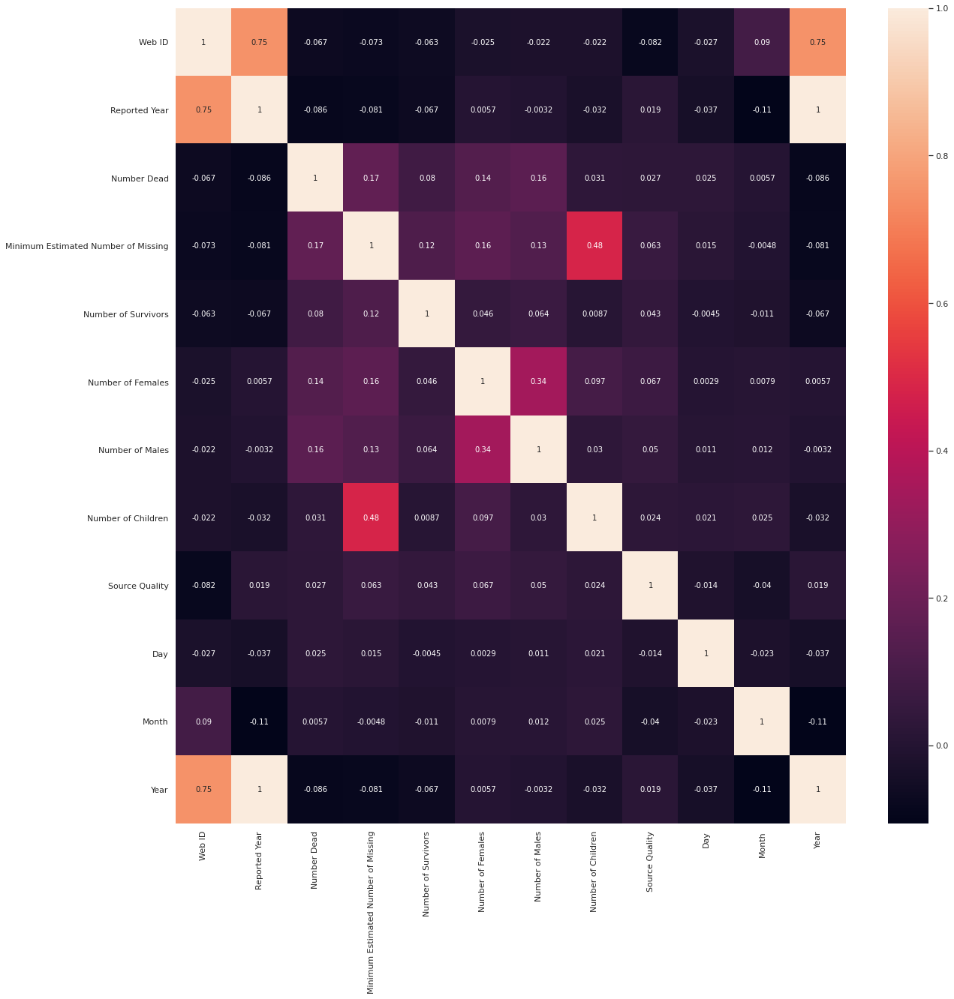

In [1930]:
fig, ax = plt.subplots(figsize=(20,20))   
sns.heatmap(immigrants.corr(), annot=True,ax=ax);

In [1990]:
dataclassification_corr = immigrants.corr()['Region'][:-1] 
print("all other features correlation to the Region:\n", dataclassification_corr.sort_values(ascending=False))

golden_features_list = dataclassification_corr[abs(dataclassification_corr) > 0.1].sort_values(ascending=False) ##write your code here
print("There is {} strongly correlated values with Region:\n{}".format(len(golden_features_list), golden_features_list))

all other features correlation to the Region:
 Region                                 1.000000
Cause of Death                         0.252168
Information Source                     0.248936
Source Quality                         0.217693
Web ID                                 0.164075
Reported Year                          0.150758
Location Description                   0.017707
UNSD Geographical Grouping             0.001840
URL                                   -0.004467
Number of Children                    -0.014203
Day                                   -0.014259
Month                                 -0.030703
Number Dead                           -0.058003
Number of Females                     -0.062335
Number of Males                       -0.065535
Minimum Estimated Number of Missing   -0.077631
Number of Survivors                   -0.102078
Migration Route                       -0.242867
Name: Region, dtype: float64
There is 8 strongly correlated values with Region:
Region   

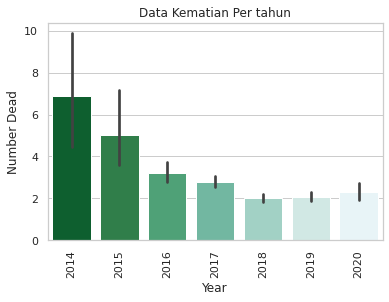

In [1932]:
sns.set_color_codes("bright")
sns.barplot(x="Year", y="Number Dead", data=immigrants,
            label="Year Suicides", palette="BuGn_r").set_title('Data Kematian Per tahun')
plt.xticks(rotation=90);

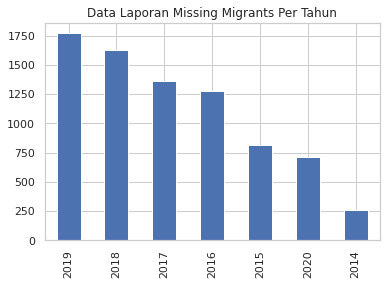

In [1934]:
immigrants['Year'].value_counts().plot(kind = "bar", title = "Data Laporan Missing Migrants Per Tahun")

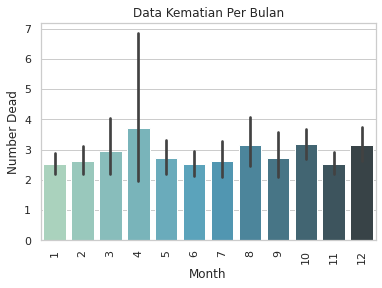

In [1935]:
sns.set_color_codes("bright")
sns.barplot(x="Month", y="Number Dead", data=immigrants,
            label="Year Suicides", palette="GnBu_d").set_title('Data Kematian Per Bulan')
plt.xticks(rotation=90);

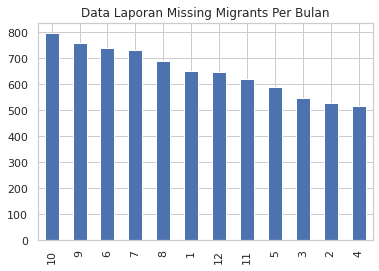

In [1936]:
immigrants['Month'].value_counts().plot(kind = "bar", title = "Data Laporan Missing Migrants Per Bulan")

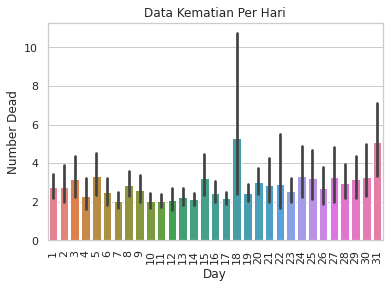

In [1937]:
sns.set_color_codes("muted")
sns.barplot(x="Day", y="Number Dead", data=immigrants,
            label="Year Suicides", palette='husl').set_title('Data Kematian Per Hari')
plt.xticks(rotation=90);

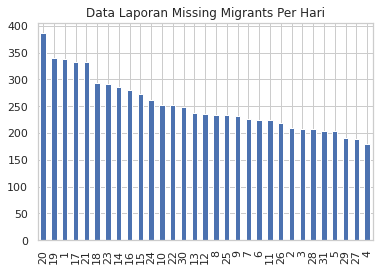

In [1938]:
immigrants['Day'].value_counts().plot(kind = "bar", title = "Data Laporan Missing Migrants Per Hari")

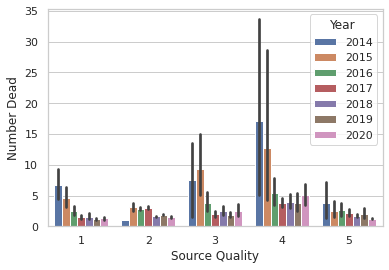

In [1939]:
sns.barplot(x='Source Quality', y='Number Dead', hue='Year', data=immigrants);

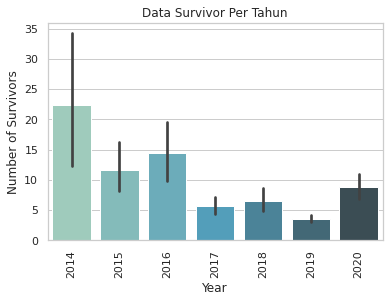

In [1940]:
sns.set_color_codes("muted")
sns.barplot(x="Year", y="Number of Survivors", data=immigrants,
            label="Year Suicides", palette='GnBu_d').set_title('Data Survivor Per Tahun')
plt.xticks(rotation=90);

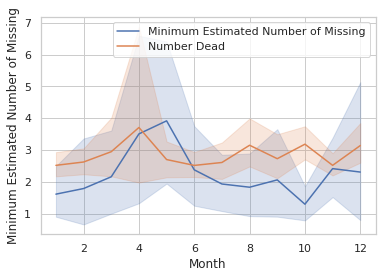

In [1941]:
sns.lineplot(x='Month', y='Minimum Estimated Number of Missing', data=immigrants)
sns.lineplot(x='Month', y='Number Dead', data=immigrants)

_ = plt.legend(['Minimum Estimated Number of Missing', 'Number Dead'])

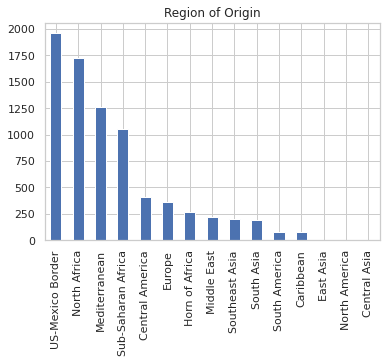

In [1942]:
immigrants['Region'].value_counts().plot(kind = "bar", title = "Region of Origin");

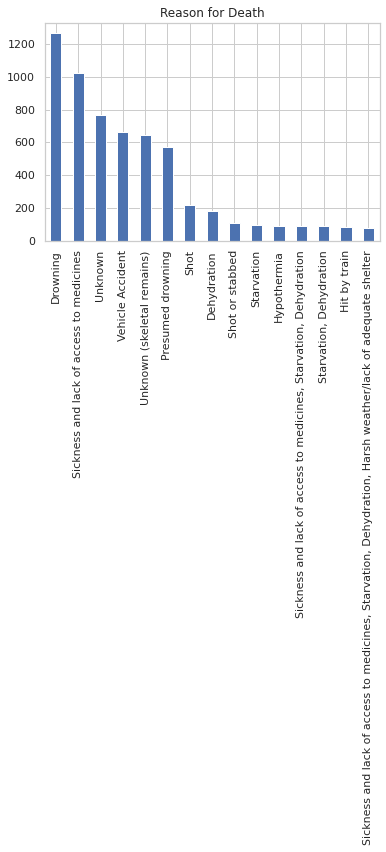

In [1943]:
immigrants['Cause of Death'].value_counts().head(15).plot(kind = "bar", title = "Reason for Death");

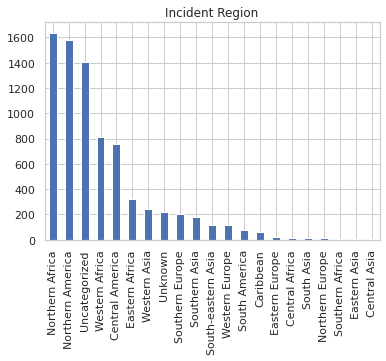

In [1944]:
immigrants['UNSD Geographical Grouping'].value_counts().plot(kind = "bar", title = "Incident Region");

In [1945]:
immigrants.groupby('Region')['Number Dead'].sum().to_frame()

,Number Dead
Region,
Caribbean,244
Central America,741
Central Asia,52
East Asia,12
Europe,634
Horn of Africa,1016
Mediterranean,7113
Middle East,655
North Africa,4718


## Feature Engineering

### Label Encoding

In [1947]:
immigrants.head()

,Web ID,Region,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality,Day,Month,Year
0,54353,Caribbean,2020-11-26,2020,Nov,2,13,15,3,1,4,1,Presumed drowning,"Off the coast of Punta del Coco, Lagunas de Ni...","Bavaro Digital, Informado","19.095626250191, -69.591168297656",Dominican Republic to Puerto Rico,"https://archive.vn/wno1A, https://archive.vn/X...",Uncategorized,3,26,11,2020
1,54344,North Africa,2020-11-24,2020,Nov,1,0,1,51,1,1,1,"Unknown (presumed dehydration, hypothermia)",On board of a boat rescued by Salvamento MarÃ­...,"rtve, AFP","27.355587205826, -16.497294462500",Western African,"https://archive.vn/MaGcf, https://archive.vn/r...",Uncategorized,3,24,11,2020
2,54347,North Africa,2020-11-24,2020,Nov,8,0,8,28,1,8,1,Presumed drowning (beaten and thrown into river),"Bodies washed up to the coast of Lanzarote, Ca...","EuropaPress, rtve, El Pais, Diario de Avisos","29.229976356699, -13.421058505078",Western African,"https://archive.vn/RItNa, https://archive.vn/M...",Uncategorized,3,24,11,2020
3,54326,Mediterranean,2020-11-23,2020,Nov,1,0,1,13,1,1,1,Presumed drowning,"Body found on beach in northwestern Rhodes, Gr...","Reuters, Associated Press","36.465524782991, 28.231215810156",Eastern Mediterranean,"https://archive.ph/537Jn, https://archive.ph/V...",Uncategorized,3,23,11,2020
4,54327,US-Mexico Border,2020-11-21,2020,Nov,1,0,1,1,1,1,1,Presumed drowning,Remains found buried close to the Rio Bravo at...,ZÃ³calo,"28.350894379517, -100.321731086330",Unknown,"https://archive.vn/wQPtX, https://archive.vn/h...",Central America,1,21,11,2020


In [1948]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [1949]:
#Get Label Encoder variables per categorical variables in the dataset
immigrants_rates = immigrants
immigrants_rates['Cause of Death'] = le.fit_transform(immigrants['Cause of Death'])
immigrants_rates['Region'] = le.fit_transform(immigrants.Region)
# immigrants_rates['Nationality'] = le.fit_transform(immigrants['Nationality'])
immigrants_rates['UNSD Geographical Grouping'] = le.fit_transform(immigrants['UNSD Geographical Grouping'])
immigrants_rates['Information Source'] = le.fit_transform(immigrants['Information Source'])
immigrants_rates['Location Description'] = le.fit_transform(immigrants['Location Description'])
immigrants_rates['Migration Route'] = le.fit_transform(immigrants['Migration Route'])
immigrants_rates['URL'] = le.fit_transform(immigrants.URL)
immigrants_rates = immigrants_rates.drop(['Reported Month'], axis = 1) 
immigrants_rates = immigrants_rates.drop(['Reported Year'], axis = 1) 
immigrants_rates.head()

,Web ID,Region,Reported Date,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality,Day,Month,Year
0,54353,0,2020-11-26,2,13,15,3,1,4,1,172,2421,202,"19.095626250191, -69.591168297656",5,2249,16,3,26,11,2020
1,54344,8,2020-11-24,1,0,1,51,1,1,1,338,2518,2039,"27.355587205826, -16.497294462500",13,2134,16,3,24,11,2020
2,54347,8,2020-11-24,8,0,8,28,1,8,1,173,626,684,"29.229976356699, -13.421058505078",13,2148,16,3,24,11,2020
3,54326,6,2020-11-23,1,0,1,13,1,1,1,172,663,1612,"36.465524782991, 28.231215810156",6,1893,16,3,23,11,2020
4,54327,14,2020-11-21,1,0,1,1,1,1,1,172,2751,2006,"28.350894379517, -100.321731086330",11,2247,2,1,21,11,2020


In [1950]:
immigrants_rates.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7818 entries, 0 to 7817
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Web ID                               7818 non-null   int64         
 1   Region                               7818 non-null   int64         
 2   Reported Date                        7818 non-null   datetime64[ns]
 3   Number Dead                          7818 non-null   int64         
 4   Minimum Estimated Number of Missing  7818 non-null   int64         
 5   Total Dead and Missing               7818 non-null   object        
 6   Number of Survivors                  7818 non-null   int64         
 7   Number of Females                    7818 non-null   int64         
 8   Number of Males                      7818 non-null   int64         
 9   Number of Children                   7818 non-null   int64         
 10  Cause of Dea

In [1951]:
immigrants['Cause of Death'].value_counts()

59     1266
216    1027
322     769
346     663
343     647
       ... 
94        1
70        1
62        1
58        1
0         1
Name: Cause of Death, Length: 363, dtype: int64

In [1952]:
immigrants_rates.to_csv('data_clean+DMY+Encoder.csv')

## Missing Migrants classification with LightGBM - SHAP

In [1953]:
pip install shap

In [1954]:
from sklearn.model_selection import train_test_split
import lightgbm as lgb # Light GBM is a gradient boosting framework that uses tree based learning algorithm
import shap

# print the JS visualization code to the notebook
shap.initjs()

### Load dataset

In [1955]:
#Split Coordinates
df = immigrants_rates.copy()
df[['Location Coordinates','Longitud']] = df['Location Coordinates'].str.split(',',expand=True)
df.head()

,Web ID,Region,Reported Date,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality,Day,Month,Year,Longitud
0,54353,0,2020-11-26,2,13,15,3,1,4,1,172,2421,202,19.095626250191,5,2249,16,3,26,11,2020,-69.591168297656
1,54344,8,2020-11-24,1,0,1,51,1,1,1,338,2518,2039,27.355587205826,13,2134,16,3,24,11,2020,-16.497294462500
2,54347,8,2020-11-24,8,0,8,28,1,8,1,173,626,684,29.229976356699,13,2148,16,3,24,11,2020,-13.421058505078
3,54326,6,2020-11-23,1,0,1,13,1,1,1,172,663,1612,36.465524782991,6,1893,16,3,23,11,2020,28.231215810156
4,54327,14,2020-11-21,1,0,1,1,1,1,1,172,2751,2006,28.350894379517,11,2247,2,1,21,11,2020,-100.321731086330


In [1956]:
df['Location Coordinates'] = df['Location Coordinates'].astype(float)
df['Longitud'] = df['Longitud'].astype(float)
print(df['Location Coordinates'].dtypes)
print(df['Longitud'].dtypes)


float64
float64


In [1957]:
df.to_csv('data_clean+DMY+Encoder+splitLongitud.csv')

In [1958]:
df.head()

,Web ID,Region,Reported Date,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality,Day,Month,Year,Longitud
0,54353,0,2020-11-26,2,13,15,3,1,4,1,172,2421,202,19.095626,5,2249,16,3,26,11,2020,-69.591168
1,54344,8,2020-11-24,1,0,1,51,1,1,1,338,2518,2039,27.355587,13,2134,16,3,24,11,2020,-16.497294
2,54347,8,2020-11-24,8,0,8,28,1,8,1,173,626,684,29.229976,13,2148,16,3,24,11,2020,-13.421059
3,54326,6,2020-11-23,1,0,1,13,1,1,1,172,663,1612,36.465525,6,1893,16,3,23,11,2020,28.231216
4,54327,14,2020-11-21,1,0,1,1,1,1,1,172,2751,2006,28.350894,11,2247,2,1,21,11,2020,-100.321731


In [1959]:
X = df[['Cause of Death', 'Region',
       'Minimum Estimated Number of Missing', 'Number of Survivors', 'Number Dead', 'UNSD Geographical Grouping', 
       'Information Source', 'Migration Route', 'Location Coordinates', 'Longitud', 'Day', 'Month', 'Year']]
y = df[[ 'Source Quality']]

# create a train/test split
train_x, test_x, train_y, test_y = train_test_split(X,y, test_size = 0.2,random_state=7)
print(train_x.shape, train_y.shape)
print(test_x.shape, test_y.shape)

(6254, 13) (6254, 1)
(1564, 13) (1564, 1)


In [1960]:
d_train = lgb.Dataset(train_x, label=train_y)
d_test = lgb.Dataset(test_x, label=test_y)

### Train the model

In [1961]:
# x = -7.6
# print(x.types())

In [1962]:
params = {
    "max_bin": 512,
    "learning_rate": 0.05,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "binary_logloss",
    "num_leaves": 10,
    "verbose": -1,
    "min_data": 100,
    "boost_from_average": True
}

model = lgb.train(params, d_train, 10000, valid_sets=[d_test], early_stopping_rounds=4, verbose_eval=1000)

Training until validation scores don't improve for 4 rounds.
Early stopping, best iteration is:
[1]	valid_0's binary_logloss: 0


In [1963]:
d_test

In [1964]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(max_depth=6, random_state=0, n_estimators=10)
model.fit(train_x, train_y)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=6, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=10, n_jobs=None, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

### Explain predictions

In [1965]:
# explainer = shap.TreeExplainer(model)
# shap_values = explainer.shap_values(X)
# # shap.initjs()

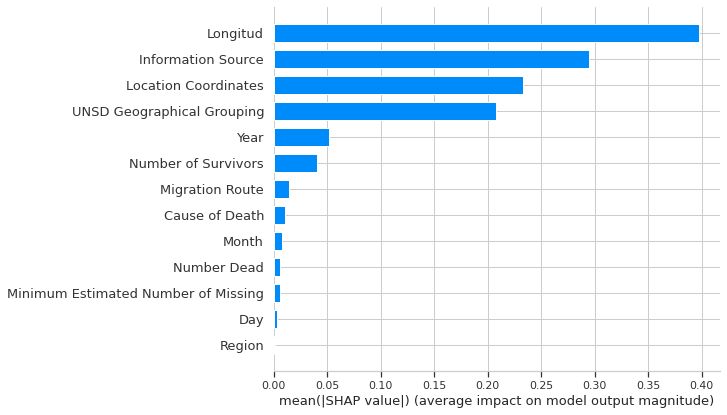

In [1966]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_x)
shap.summary_plot(shap_values, train_x, plot_type="bar")

#### Visualize a single prediction

In [1967]:
# shap_values_c = np.array(shap_values)
# X_c = np.array(X)

In [1968]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

#### Visualize many predictions

In [1969]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:1000,:], X.iloc[:1000,:])

#### SHAP Summary Plot

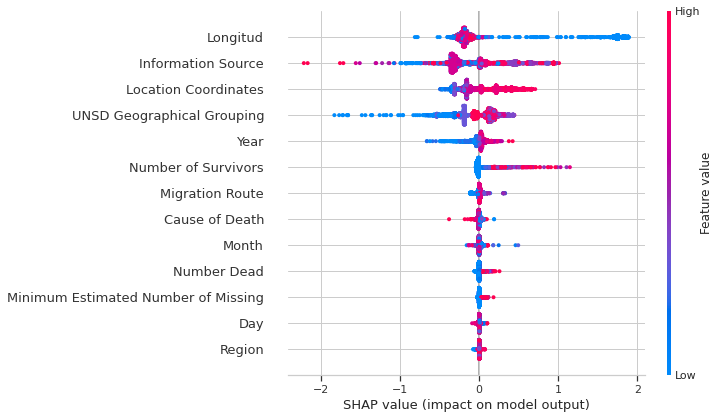

In [1970]:
shap.summary_plot(shap_values, train_x)

# Most affected Region

In [1971]:
immigrants_rates.head()

,Web ID,Region,Reported Date,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality,Day,Month,Year
0,54353,0,2020-11-26,2,13,15,3,1,4,1,172,2421,202,"19.095626250191, -69.591168297656",5,2249,16,3,26,11,2020
1,54344,8,2020-11-24,1,0,1,51,1,1,1,338,2518,2039,"27.355587205826, -16.497294462500",13,2134,16,3,24,11,2020
2,54347,8,2020-11-24,8,0,8,28,1,8,1,173,626,684,"29.229976356699, -13.421058505078",13,2148,16,3,24,11,2020
3,54326,6,2020-11-23,1,0,1,13,1,1,1,172,663,1612,"36.465524782991, 28.231215810156",6,1893,16,3,23,11,2020
4,54327,14,2020-11-21,1,0,1,1,1,1,1,172,2751,2006,"28.350894379517, -100.321731086330",11,2247,2,1,21,11,2020


In [1974]:
immigrants_rates

,Web ID,Region,Reported Date,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality,Day,Month,Year
0,54353,0,2020-11-26,2,13,15,3,1,4,1,172,2421,202,"19.095626250191, -69.591168297656",5,2249,16,3,26,11,2020
1,54344,8,2020-11-24,1,0,1,51,1,1,1,338,2518,2039,"27.355587205826, -16.497294462500",13,2134,16,3,24,11,2020
2,54347,8,2020-11-24,8,0,8,28,1,8,1,173,626,684,"29.229976356699, -13.421058505078",13,2148,16,3,24,11,2020
3,54326,6,2020-11-23,1,0,1,13,1,1,1,172,663,1612,"36.465524782991, 28.231215810156",6,1893,16,3,23,11,2020
4,54327,14,2020-11-21,1,0,1,1,1,1,1,172,2751,2006,"28.350894379517, -100.321731086330",11,2247,2,1,21,11,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7813,39207,14,2014-01-16,1,0,1,1,1,1,1,204,4079,1348,"31.344700000000, -109.545000000000",2,348,8,5,16,1,2014
7814,39368,4,2014-01-16,1,0,1,2,1,1,1,124,799,441,"59.155100000000, 27.858600000000",11,355,9,1,16,1,2014
7815,39257,14,2014-01-14,1,0,1,1,1,1,1,343,2608,1503,"32.058118300000, -111.623576100000",2,0,8,5,14,1,2014
7816,39256,14,2014-01-12,1,0,1,1,1,1,1,343,2608,1503,"32.058118300000, -111.623576100000",2,0,8,5,12,1,2014


In [1977]:
#create new column of marker labels for folium map
marker_labels = []
# print(marker_labels.dtype())
for i in range(len(immigrants_rates)):
  
  marker_loc = immigrants_rates['Location Description'][i] 
  marker_date = immigrants_rates['Reported Date'][i]
  marker_number = immigrants_rates['Total Dead and Missing'][i]
  marker_cause = immigrants_rates['Cause of Death'][i]
  #adding object series into 'Marker Labels'
  # print(i)
  c = 'Location: ' , marker_loc , '; Date: ', marker_date , '; Total Dead and Missing: ' , marker_number , '; Cause of Death: ' , marker_cause
  marker_labels.append( c)
immigrants_rates['Marker Label'] = marker_labels

In [1978]:
#map the data
from ast import literal_eval
from folium.plugins import MarkerCluster
import folium

incidents_map = folium.Map(location=[50,0], tiles = 'CartoDB dark_matter', zoom_start=3, min_zoom = 2.5, control_scale = True)

marker_cluster = MarkerCluster().add_to(incidents_map)

for i in range(immigrants_rates.shape[0]):
    loc = list(literal_eval(immigrants_rates.iloc[i]['Location Coordinates']))
    folium.Marker(
        location = loc,
        popup = folium.Popup(immigrants_rates.iloc[i]['Marker Label']), 
        tooltip = immigrants_rates.iloc[i]['Marker Label'],
        icon=folium.Icon(color='red'),
    ).add_to(marker_cluster)


display(incidents_map)

Region that has the largest number of incident

In [1986]:
#number of incidents
incidents_reg_count = data['Region'].value_counts()

In [1987]:
data['Cause of Death'].value_counts()

Health Condition                1602
Unknown                         1518
Drowning                        1285
Accident                        1098
Presumed drowning                574
                                ... 
Probable hypothermia               1
Respiratory illness                1
Presumed COVID-19                  1
Bus fire                           1
Injuries from violent attack       1
Name: Cause of Death, Length: 87, dtype: int64

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


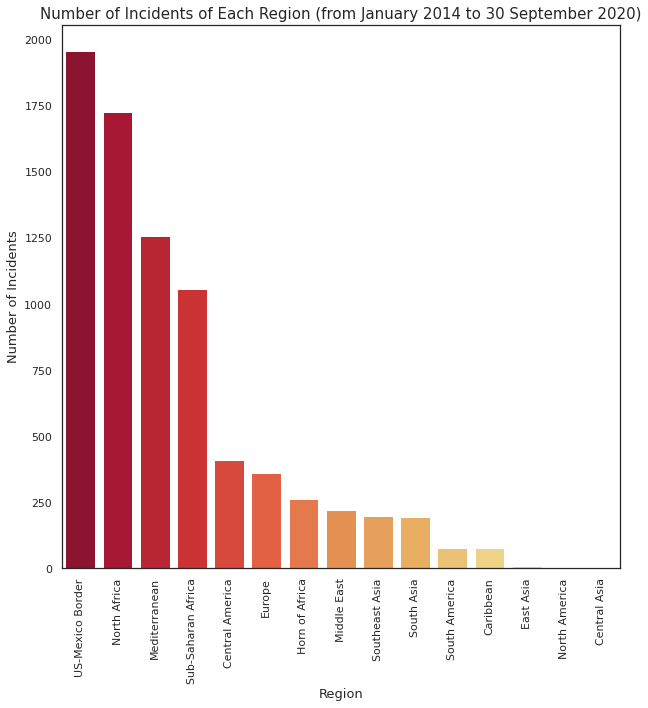

In [1988]:
#bar graph
sns.set(style="white")
plt.figure(figsize=(10,10))
sns.barplot(incidents_reg_count.index, incidents_reg_count.values, palette='YlOrRd_r')
plt.xlabel('Region', fontsize = 13)
plt.xticks(rotation = 90)
plt.ylabel('Number of Incidents', fontsize = 13)
plt.title('Number of Incidents of Each Region (from January 2014 to 30 September 2020)', fontsize = 15)
plt.show()

# Biggest Cause of Death on Missing Migrants

In [1982]:
#import regular expression library
import re

# #dict of given causes of death and frequency
# #use regular expression to split string and ignore whitespace
# dict_type_count = {}
# for d in immigrants_rates['Cause of Death'].index:
#     list_temp = []
#     list_temp.extend(re.split(r'[,]\s*',immigrants_rates['Cause of Death'][d])) 
#     for i in list_temp:
#         if i not in dict_type_count:
#             dict_type_count[i] = 1
#         else:
#             dict_type_count[i] += 1

#converting dictionary into series
death_type_count = pd.Series(data['Cause of Death'].value_counts())
print('death_type_count \n{}'.format(death_type_count.sort_values(ascending=False)[:10]))

death_type_count 
Health Condition     1602
Unknown              1518
Drowning             1285
Accident             1098
Presumed drowning     574
Starvation            480
Murdered              466
Hypothermia           176
harsh_weather         115
Suffocation            56
Name: Cause of Death, dtype: int64


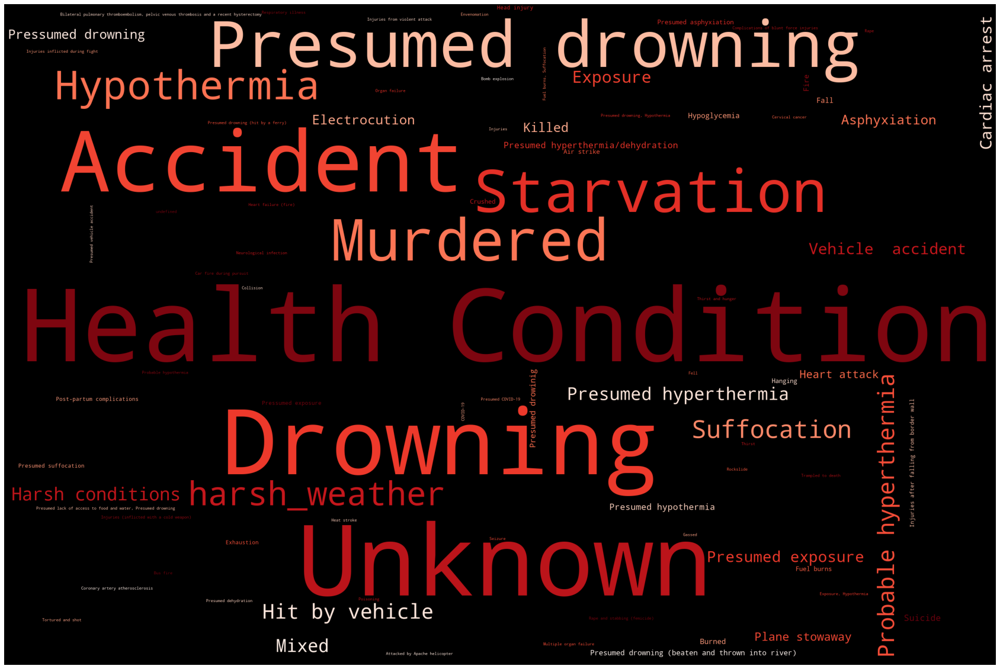

In [1983]:
from wordcloud import WordCloud, STOPWORDS


wordcloud = WordCloud(width = 3000, height = 2000 , background_color = 'black', colormap = 'Reds',
                       stopwords = STOPWORDS).generate_from_frequencies(death_type_count.to_dict())

fig = plt.figure(figsize = (30,25))
plt.imshow(wordcloud)
plt.axis('off')

plt.show()

In [1991]:
df.head()

,Web ID,Region,Reported Date,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality,Day,Month,Year,Longitud
0,54353,0,2020-11-26,2,13,15,3,1,4,1,172,2421,202,19.095626,5,2249,16,3,26,11,2020,-69.591168
1,54344,8,2020-11-24,1,0,1,51,1,1,1,338,2518,2039,27.355587,13,2134,16,3,24,11,2020,-16.497294
2,54347,8,2020-11-24,8,0,8,28,1,8,1,173,626,684,29.229976,13,2148,16,3,24,11,2020,-13.421059
3,54326,6,2020-11-23,1,0,1,13,1,1,1,172,663,1612,36.465525,6,1893,16,3,23,11,2020,28.231216
4,54327,14,2020-11-21,1,0,1,1,1,1,1,172,2751,2006,28.350894,11,2247,2,1,21,11,2020,-100.321731


In [1992]:
data.head()

,Web ID,Region,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
0,54353,Caribbean,2020-11-26,2020,Nov,2,13,15,3,1,4,1,Presumed drowning,"Off the coast of Punta del Coco, Lagunas de Ni...","Bavaro Digital, Informado","19.095626250191, -69.591168297656",Dominican Republic to Puerto Rico,"https://archive.vn/wno1A, https://archive.vn/X...",Uncategorized,3
1,54344,North Africa,2020-11-24,2020,Nov,1,0,1,51,1,1,1,Unknown,On board of a boat rescued by Salvamento MarÃ­...,"rtve, AFP","27.355587205826, -16.497294462500",Western African,"https://archive.vn/MaGcf, https://archive.vn/r...",Uncategorized,3
2,54347,North Africa,2020-11-24,2020,Nov,8,0,8,28,1,8,1,Presumed drowning (beaten and thrown into river),"Bodies washed up to the coast of Lanzarote, Ca...","EuropaPress, rtve, El Pais, Diario de Avisos","29.229976356699, -13.421058505078",Western African,"https://archive.vn/RItNa, https://archive.vn/M...",Uncategorized,3
3,54326,Mediterranean,2020-11-23,2020,Nov,1,0,1,13,1,1,1,Presumed drowning,"Body found on beach in northwestern Rhodes, Gr...","Reuters, Associated Press","36.465524782991, 28.231215810156",Eastern Mediterranean,"https://archive.ph/537Jn, https://archive.ph/V...",Uncategorized,3
4,54327,US-Mexico Border,2020-11-21,2020,Nov,1,0,1,1,1,1,1,Presumed drowning,Remains found buried close to the Rio Bravo at...,ZÃ³calo,"28.350894379517, -100.321731086330",Unknown,"https://archive.vn/wQPtX, https://archive.vn/h...",Central America,1
